In [1]:
%pylab inline

from IPython import display
from IPython.display import HTML

from warnings import filterwarnings
filterwarnings('ignore')

Populating the interactive namespace from numpy and matplotlib


<!-- PELICAN_BEGIN_SUMMARY -->

Awhile ago, I came across [a really neat tool](http://colormind.io/image/) that allows a user to pass in an image and generate a representative color pallet, derived from the colors of the image, essentially going from this...

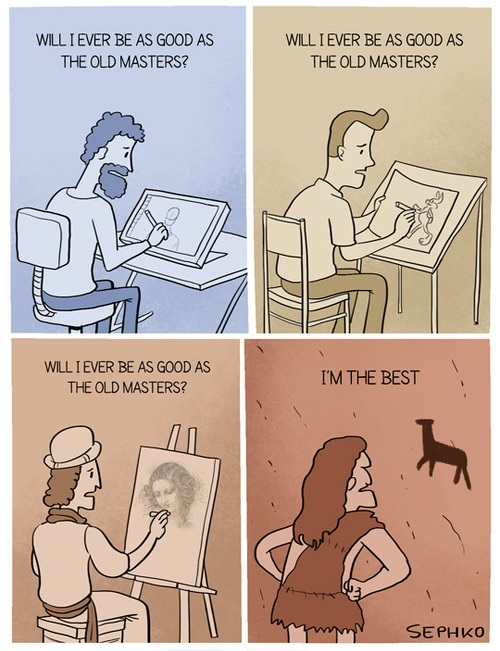

In [2]:
display.Image('Images/old_masters.jpg')

... to this

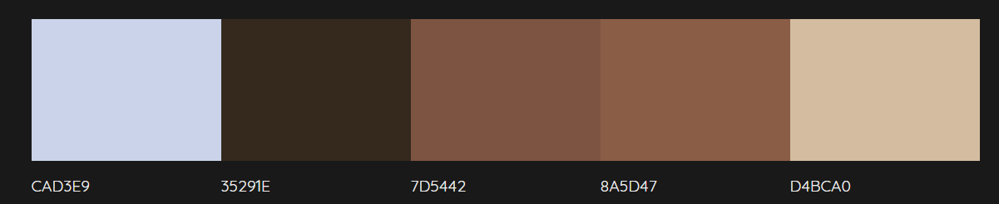

In [3]:
display.Image('Images/old_masters_colors.png')

And so after cramming a slew of `.PNG` files I had laying around, I got curious how it actually worked. Which, in turn, led to my first bit of rabbit-holing on working with image data in Python.

I never got around to learning how to recreate the site's algorithm one-to-one, but I *did* pick up a bunch of practical skills and raise some interesting questions I thought merited sharing :)

<!-- PELICAN_END_SUMMARY -->

##  Thinking of Images as Vectors

To get things kicked off, I'm going to import Pillow (PIL), the batteries-included, bread-and-butter Image Processing library in Python

In [4]:
from PIL import Image, ImageDraw

and use it to load up an image from a cache of movie posters I downloaded for a side-project that never went anywhere, haha

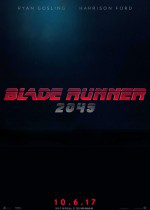

In [5]:
img = Image.open('posters/Blade Runner 2.png')
img

And so `img` represents an object of type `JpegImageFile`, which allows us to do handy things like crop or do some light editing

In [6]:
type(img)

PIL.JpegImagePlugin.JpegImageFile

But more importantly for the purposes of this post, it also makes it neatly consumable by Python's darling computation workhorse, `numpy`. Here, we're going to stuff the image into an `array`, so we go from pixels to a bunch of numbers that *represent the pixels*.

In [7]:
import numpy as np
vec = np.array(img)

If we take a peek at `vec`, we get a big, incomprehensible printout of a bunch of numbers

In [8]:
vec

array([[[ 7, 19, 35],
        [ 8, 20, 36],
        [ 8, 20, 36],
        ...,
        [ 7, 14, 30],
        [ 7, 14, 30],
        [ 7, 14, 30]],

       [[ 8, 20, 36],
        [ 8, 20, 36],
        [ 9, 21, 37],
        ...,
        [ 8, 15, 31],
        [ 7, 14, 30],
        [ 7, 14, 30]],

       [[ 8, 20, 36],
        [ 8, 20, 36],
        [ 9, 21, 37],
        ...,
        [ 8, 15, 31],
        [ 7, 14, 30],
        [ 7, 14, 30]],

       ...,

       [[ 0,  0,  4],
        [ 1,  2,  6],
        [ 3,  4,  8],
        ...,
        [ 3,  4,  8],
        [ 0,  0,  4],
        [ 0,  0,  4]],

       [[ 2,  3,  7],
        [ 0,  0,  5],
        [ 5,  6, 11],
        ...,
        [ 0,  1,  6],
        [ 1,  2,  7],
        [ 0,  1,  5]],

       [[ 2,  3,  7],
        [ 0,  0,  5],
        [ 0,  0,  5],
        ...,
        [ 0,  0,  5],
        [ 3,  4,  9],
        [ 0,  1,  5]]], dtype=uint8)

But a closer look at the *shape* of this object helps us interpret what we're looking at

In [9]:
vec.shape

(210, 150, 3)

It's no accident that looking that the size of our original image, it has a width of 150 pixels and a height of 210.

In [10]:
img.size

(150, 210)

But what of the `3` at the end of `(210, 150, 3)`?

Well, these represent the distinct <strong>R</strong>ed, <strong>G</strong> reen, and <strong>B</strong>lue values that define the color of each pixel. If this concept is foreign to you, [poke around this site for a minute or two](https://www.rapidtables.com/web/color/RGB_Color.html), as it's pretty much the crux of the rest of the post.

All told, each of the `height x width` different pixels having their own `RGB` values mean that our simple, compact image is actually represented by a lot of numbers

In [11]:
vec.size

94500

So what should we do with these numbers?

## TL;DR: K-Means Clustering

Clustering is one of the core areas of unsupervised learning, and essentially answers "I have a bunch of data, can you segment it into groups for me?"

Perhaps the easiest of these algorithms to understand is K-Means, which can be summarized as

1. Pick N random spots on the grid
2. For each point of data you've got, figure out which target is closest
3. Is there an about-even split of points-to-closet-targets?

    - Yes? Done deal
    - No? Move the targets a bit and check again
    
For a less hand-wavy explanation (featuring great graphics), I like this video

In [12]:
# Youtube
HTML('<iframe width="560" height="315" '
     'src="https://www.youtube.com/embed/IuRb3y8qKX4" '
     'frameborder="0" gesture="media" allow="encrypted-media" '
     'allowfullscreen></iframe>')

But not to dwell too long on the topic, let's cobble together a quick example to demonstrate this visually.

I'm going to lean on the most vanilla dataset in all of Data Science, which is basically petal and sepal measurements of a bunch of flowers.

In [13]:
import seaborn as sns

iris = sns.load_dataset('iris')
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


For the sake of visualization, we're going to throw away all but two columns to make a cheap scatter plot

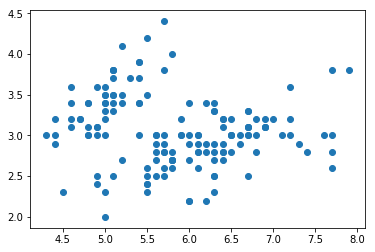

In [14]:
trimmedData = iris.loc[: , ['sepal_length', 'sepal_width']]

plt.scatter(x=trimmedData['sepal_length'], y=trimmedData['sepal_width']);

Then, we're going to leverage the K-Means implementation in `sklearn` to try and separate these points into 3 different groups

In [15]:
from sklearn.cluster import KMeans

model = KMeans(n_clusters=3)
model.fit(trimmedData)
trimmedData['label'] = model.labels_

This runs almost instantly for such a small dataset, and now we can plot the same points, but this time assigning a color based on which group they wound up in.

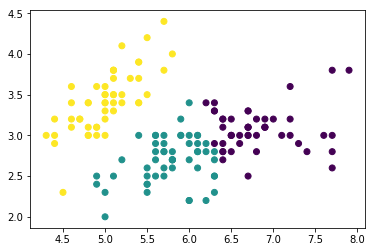

In [16]:
plt.scatter(x=trimmedData['sepal_length'],
            y=trimmedData['sepal_width'],
            c=trimmedData['label']);

To hammer the point home, running K-Means over this data to get three Targets yields three groups:

1. The Purple points are centered around, on average, `(5.0, 4.0)`
2. The Teal points are centered around, on average, `(5.6, 2.7)`
3. The Yellow points are centered around, on average, `(7.3, 3.3)`

## Manipulating

Our example above clustered points arranged in two-dimensional, X/Y space. However, this extends painlessly into 3-dimensions, where our `(R, G, B)` color definitions live. First, though, we need to take our original `210 x 150` image and basically unravel it into one long chain of RGB values.

`numpy` makes this a breeze with `reshape`

In [17]:
reshaped = vec.reshape(-1, 3)
reshaped.shape

(31500, 3)

The `-1` in the function call might seem confusing at a first glance, but basically we knew we wanted to package everything into chunks of `3`, per RGB. The `-1` is an indicator that `numpy` should just figure out how to make that happen. Thus, it takes all 94,500 points of data (as above), and realizes that you can cleanly group them into 3's if you make one long list of 31.5k elements.

At this point, we're wandering into the neighborhood of "our data is getting hard to interpret"

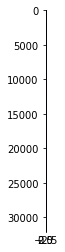

In [18]:
plt.imshow(reshaped);

but trust me, this is one long line of every pixel of our original image.

## All Together

For convenience, I've packaged the rest of my spaghetti code into functions any interested reader [can check out here](https://github.com/NapsterInBlue/Movie-Posters-2017).

In [19]:
from imagetools import (path_to_img_array,
                        pick_colors, 
                        show_key_colors)

But basically these:

- Load an image up to a vector, from a given path

In [20]:
path = 'posters/Blade Runner 2.png'
vec = path_to_img_array(path)
vec.shape

(210, 150, 3)

- Unrolls our image and runs K-Means clustering to find the 4 "Target Points" all of the pixel values are grouped around

In [21]:
colors = pick_colors(vec, 3)
colors

array([[ 14.84415584,  48.46459201,  67.83851997],
       [  3.55864673,   7.16823366,  16.27111591],
       [124.19018405,  31.15132924,  55.46216769]])

- Finally, one last function to take these Targets and plot out some simple boxes to show the colors it found

(14, 48, 67)
(3, 7, 16)
(124, 31, 55)


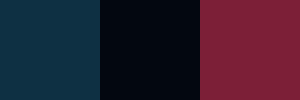

In [22]:
show_key_colors(colors)

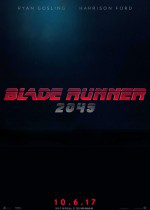

In [23]:
Image.open('Posters/Blade Runner 2.png')

Looks about right, yeah?

### Considering the Number of Means

As I played around with this, I quickly discovered that generating a meaningful color palette from an image was *very* sensitive to how many means you ask `sklearn` to sniff out.

Lets take a look at a more interesting poster (from a movie I never heard of...)

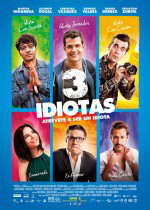

In [24]:
path = 'posters/3 Idiotas.png'
img = Image.open(path)
img

Running K-Means for a mere two colors gives the following

(35, 100, 136)
(203, 158, 132)


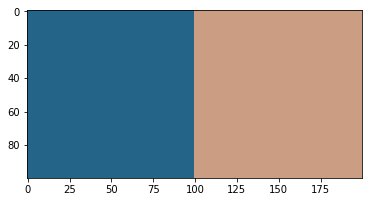

In [25]:
img = path_to_img_array(path)
plt.imshow(show_key_colors(pick_colors(img, 2)));

Interestingly, we captured the blue of the image (the majority color). On the other hand, we've determined that the "average color" of lime green, fuchsia, honey yellow, hot pink, orange, and lavender is... a gross beige, lol

But take a look at what happens when we allow for more and more means:

At 3, we separate light and dark tones

(25, 127, 187)
(214, 176, 140)
(81, 61, 59)


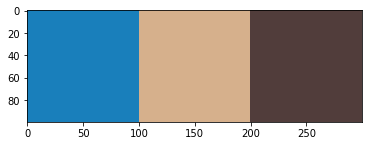

In [26]:
img = path_to_img_array(path)
plt.imshow(show_key_colors(pick_colors(img, 3)));

At 4, we extract brown tones from light/dark

(222, 208, 200)
(26, 126, 185)
(49, 47, 42)
(185, 125, 85)


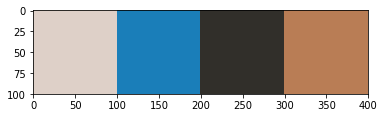

In [27]:
img = path_to_img_array(path)
plt.imshow(show_key_colors(pick_colors(img, 4)));

At 5, we split brown to get purple and yellow

(143, 101, 109)
(19, 127, 189)
(222, 206, 200)
(42, 39, 35)
(230, 175, 47)


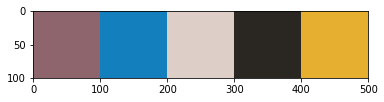

In [28]:
img = path_to_img_array(path)
plt.imshow(show_key_colors(pick_colors(img, 5)));

At 6, we split purple into a salmon and an olive green

(42, 32, 32)
(89, 120, 115)
(180, 90, 105)
(16, 128, 192)
(232, 181, 39)
(222, 207, 200)


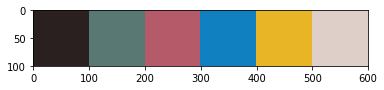

In [29]:
img = path_to_img_array(path)
plt.imshow(show_key_colors(pick_colors(img, 6)));

At 7, we split our blue into two

(183, 91, 107)
(9, 124, 189)
(39, 29, 28)
(232, 212, 201)
(232, 181, 38)
(84, 106, 93)
(114, 159, 193)


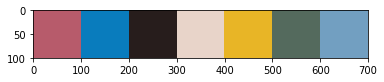

In [30]:
img = path_to_img_array(path)
plt.imshow(show_key_colors(pick_colors(img, 7)));

Finally, 8 gives us about as diverse a palette as we'd like from this image

(108, 160, 200)
(233, 180, 29)
(39, 30, 29)
(82, 112, 101)
(236, 231, 226)
(9, 124, 189)
(173, 74, 94)
(213, 166, 145)


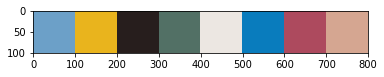

In [31]:
img = path_to_img_array(path)
plt.imshow(show_key_colors(pick_colors(img, 8)));

So obviously allowing for more means, could help us pick out more unique colors. Neat.

### Considering Image Size

Until now, we've been looking at meager `150 x 210` images. What happens when we examine larger images?

To play with this idea, I took a still from [The Grand Budapest Hotel](https://www.imdb.com/title/tt2278388/), a delightfully-colorful movie that I love.

At a glance, it seems like a no-brainer what 5 colors we'd come up with 

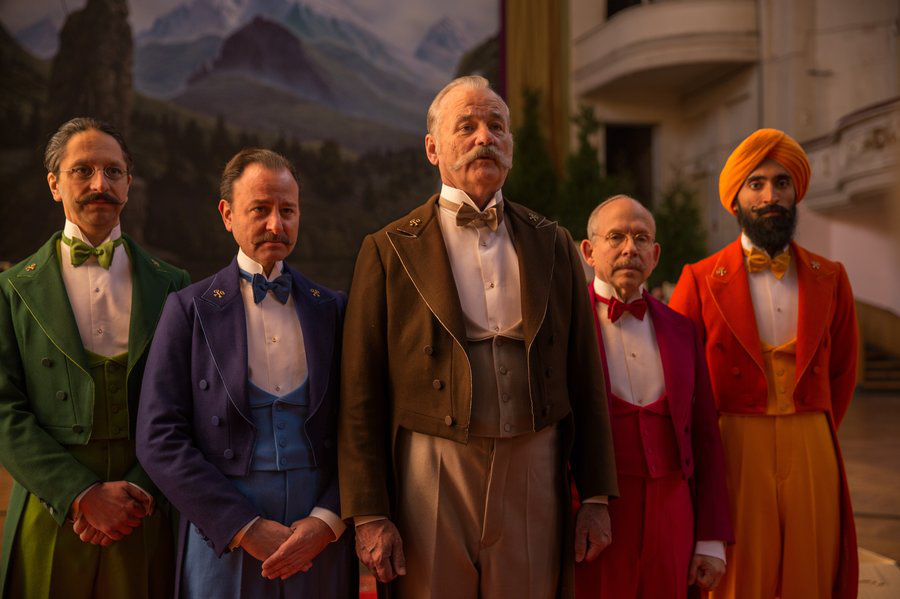

In [32]:
wes = Image.open('Images/wes.png')
wes

Or so I thought

(34, 18, 12)
(110, 25, 8)
(119, 85, 71)
(69, 47, 35)
(200, 126, 88)


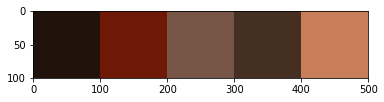

In [33]:
path = 'images/wes.png'
img = path_to_img_array(path)
plt.imshow(show_key_colors(pick_colors(img, 5)));

I'll spare you the suspense-- trying different values from 5 and up, we never really achieve the clean, "green, blue, brown, red, orange" sampling we'd expect.

(42, 30, 23)
(124, 35, 7)
(112, 78, 61)
(216, 146, 106)
(67, 58, 62)
(141, 102, 89)
(78, 43, 21)
(80, 5, 6)
(24, 13, 7)
(199, 85, 34)


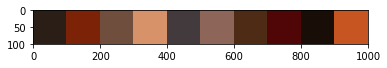

In [34]:
path = 'images/wes.png'
img = path_to_img_array(path)
plt.imshow(show_key_colors(pick_colors(img, 10)));

This is likely due to the fact that while their clothing makes up about 50% of the image, the other 50% is comprised of skin tones, the white wall, the painting in the back ground, etc. This muddles up the points K-Means considers when trying to find these neat Target points. Indeed, if we were *really* hell-bent on getting those colors to pop, we might do some naive Photoshopping to erase all of the background noise, then rerun.

But that's not the focus of this section of the post. Instead, I want to focus on the actual computation that we're doing.

If you take a look at the underlying shape, we've got a `600 x 900` image

In [35]:
path = 'images/wes.png'
img = path_to_img_array(path)
img.shape

(599, 900, 3)

Which tallies to-- including RGB values-- a massive amount of data

In [36]:
img.size

1617300

By contrast, recall the total size of our movie posters coming in at

In [37]:
vec.size

94500

Or as a percentage

In [38]:
vec.size / img.size

0.05843071786310518

What you <strong>didn't</strong> see, reading this finished post, was how long each stab at this was taking to run.

We can use the `%time` command in our Jupyter Notebook to see how long it takes us to generate our target colors.

(30, 19, 13)
(109, 78, 62)
(134, 39, 8)
(72, 41, 20)
(216, 139, 93)
(145, 101, 84)
(84, 7, 6)
(62, 53, 58)
Wall time: 23.7 s


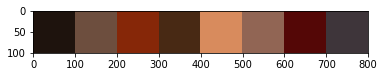

In [39]:
path = 'images/wes.png'
img = path_to_img_array(path)

%time plt.imshow(show_key_colors(pick_colors(img, 8)));

20 seconds. Compare that to the runtime with a much smaller image.

(4, 11, 26)
(115, 29, 54)
(15, 59, 80)
(1, 3, 7)
(8, 29, 46)
(170, 26, 58)
(74, 84, 96)
(59, 7, 21)
Wall time: 864 ms


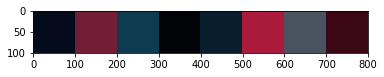

In [40]:
path = 'posters/Blade Runner 2.png'
img = path_to_img_array(path)

%time plt.imshow(show_key_colors(pick_colors(img, 8)));

We measure calculating over an image 5% of the size, in miliseconds. But our `600 x 900` image takes almost half a minute.

More to the point, anyone familiar with image files probably knows that `600 x 900` really isn't that big at all. You can imagine what would happen if we tried running it for this image

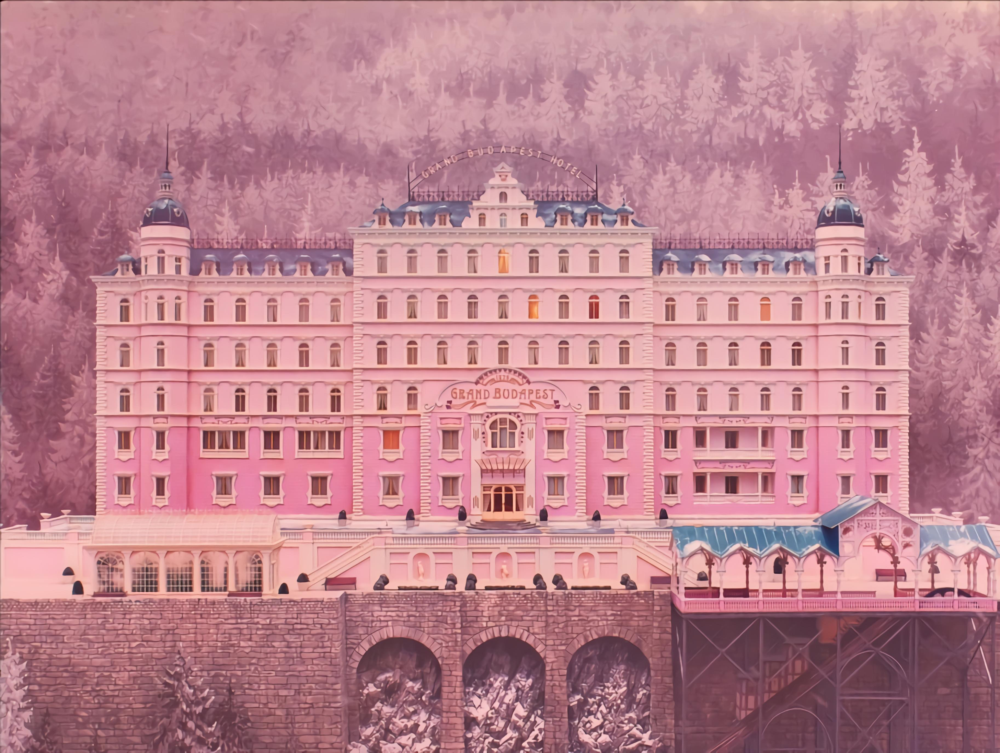

In [41]:
path = 'images/bigWes.png'
img = Image.open(path)
img

Which is actually of size

In [42]:
img.size

(3652, 2752)

And considering this many numbers

In [43]:
np.array(img).size

30150912

Woof.

(237, 180, 182)
(184, 125, 139)
(111, 66, 79)
(211, 150, 162)
(154, 96, 110)
Wall time: 2min 43s


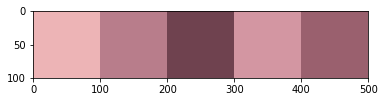

In [44]:
path = 'images/bigWes.png'
img = path_to_img_array(path)

%time plt.imshow(show_key_colors(pick_colors(img, 5)));

I've got a pretty powerful workbench, as far as home PC's go. I literally got up and did laundry and got some coffee. If we're going to keep playing around with this tool, we need to figure out how to tighten up the feedback loop by decreasing the run time.

### Can We Do the Same with Less?

In other words, what are the potential drawbacks of just using smaller images?

I took the following snapshot from the movie [Zootopia](https://www.imdb.com/title/tt2948356/). Not only does it hold the distinction of ["darkest deleted Pixar scene, this side of Up"](https://www.youtube.com/watch?v=aNS86cYXd6Q), but every frame of the movie is full of extremely vibrant color.

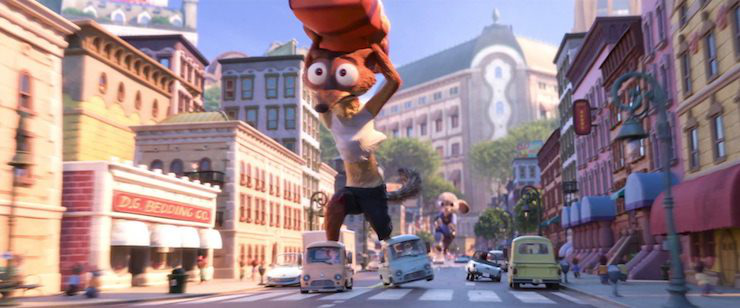

In [45]:
zoo = Image.open('Images/zoo.png')
zoo

This image in particular is `740 x 308` and yields the following colors, when fishing for 5 Targets

In [46]:
zoo.size

(740, 308)

(246, 219, 196)
(114, 97, 112)
(179, 185, 226)
(73, 51, 59)
(170, 140, 143)
Wall time: 5.46 s


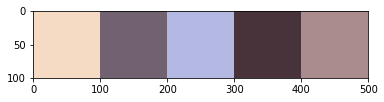

In [47]:
img = np.array(zoo)

%time plt.imshow(show_key_colors(pick_colors(img, 5)));

But what happens when we use the same image, but only 100 pixels wide?

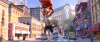

In [48]:
zoo_small = Image.open('Images/zoo_small.png')
zoo_small

<strong>Basically the same result, but in almost 2% of the time!</strong>

(242, 216, 192)
(190, 151, 144)
(83, 60, 71)
(178, 183, 222)
(123, 109, 124)
Wall time: 133 ms


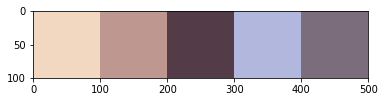

In [49]:
img = np.array(zoo_small)
%time plt.imshow(show_key_colors(pick_colors(img, 5)));

This might be surprising at first, but don't let the size of the image throw you for a loop-- there's plenty of information in the `100 x 42` representation.

Indeed, if we use some photo-editing software ([I like Paint.net](https://www.getpaint.net/)) to blow the image back up to its original resolution, it uses the pixel values in the smaller images to extrapolate to the bigger, albeit blurry, image.

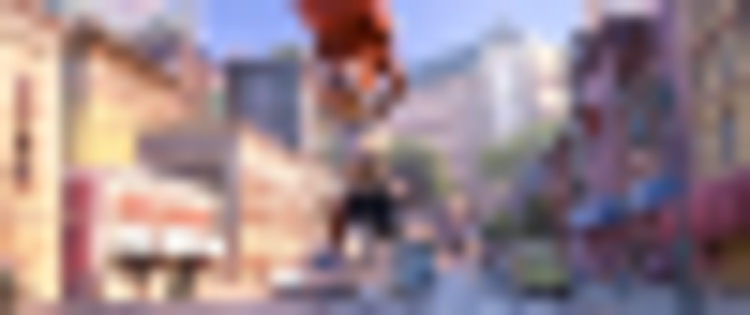

In [50]:
grainy = Image.open('Images/grainyZoo.png')
grainy

Lo and behold, running KMeans on `grainy` yields the same

(84, 61, 73)
(235, 201, 175)
(183, 189, 227)
(120, 104, 118)
(172, 146, 149)


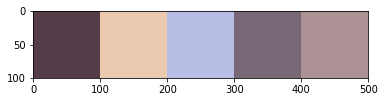

In [51]:
img = np.array(grainy)
plt.imshow(show_key_colors(pick_colors(img, 5)));

And so the similarity of the two results shouldn't surprise you. After all, KMeans arrives at the Target values by just taking a bunch of averages-- which is precisely what's happening when I scale down and then back up with the image:

* We need to compress an image into less space, so we remove data that's close enough to its neighbor that we still have it
* When we scale back out, we do sort of broadcast that "representitive color" out to its surrounding area in order to fill the space

Because it's just averages, we arrive at more or less the same palette

### One (whole mess of) Step(s) Further

So as we saw, we achieved comparable results, in dramatically faster runtimes, on relatively smaller images. Now the question becomes

> How much can we scale things down before we're guaranteed to lose our information?

For the sake of example, imagine that I had instead shrank the picture to 5 pixels wide, not 100. What then?

In [52]:
Image.open('Images/zoo_tiny.png')

^ That's an image, lol

I'll spare you doing one of these numbers

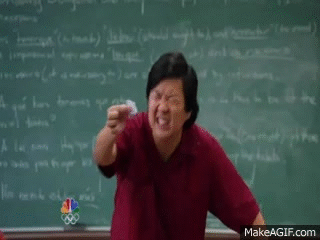

In [53]:
display.Image('Images/chang.gif')

and like before, I'll resize back to the original size, using the smaller representation.

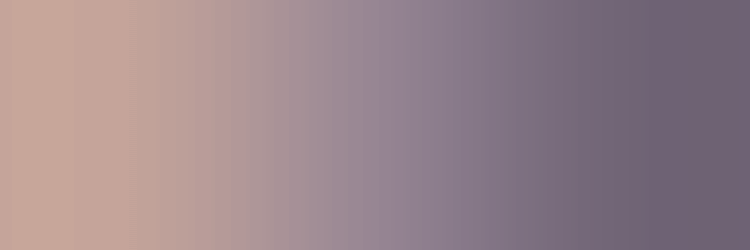

In [54]:
display.Image('Images/RIPzoo.png')

And perhaps-unsurprisingly, if the image we're feeding in is `5 x 2`, it basically just picks 5 of the points, from left to right

In [55]:
tiny = Image.open('Images/zoo_tiny.png')
tiny.size

(5, 2)

(90, 73, 94)
(207, 172, 155)
(155, 135, 151)
(116, 104, 118)
(172, 169, 188)


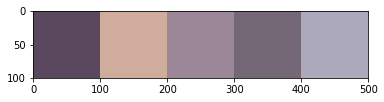

In [56]:
img = np.array(tiny)
plt.imshow(show_key_colors(pick_colors(img, 5)));

But with *noticeably-less* sharpness of color, relative to our original image.

(170, 140, 144)
(73, 51, 59)
(179, 185, 226)
(114, 97, 112)
(246, 218, 196)


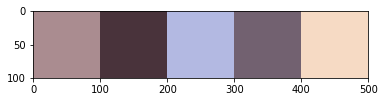

In [57]:
grainy = Image.open('Images/zoo.png')
img = np.array(grainy)
plt.imshow(show_key_colors(pick_colors(img, 5)));

## Conclusion

I started this whole line of tinkering by trying to figure out how these color palette sites work. I was able to get a good-enough solution that handled the task quickly for *small* images via the K-Means algorithm. However, the webapp I was initially playing with runs considerably quicker against anything north of 400 pixels wide-- if I had to guess, they're probably doing some preliminary image shrinking like we saw in the Zootopia example.

But as I sat scratching my head, trying to figure out how to generalize this approach, I'm left with two open-ended questions:

1. Is there a way we can automate the optimal number of means to search for in an image? For instance, `3 Idiotas.png` wound up giving us a nice, representative palette at 8 means. `Blade Runner 2.png` only needed 3 to get the gist
2. If, for performance's sake, we intended to shrink the image before running K-Means, is there some rule of thumb that we can employ to ensure that we don't over-shrink and lose the sharpness/distinctness of our palette?

So on the off chance that someone reading this is well-versed in the niche corner of computer science that has these answers, [feel free to hit me up](https://twitter.com/home) with links and knowledge bombs!

Cheers,

-Nick

------------------------

This post was actually derivative of a notebook that I wrote *ages* ago for a demo I was putting on. The link to the source code, as well as a bunch of unrelated movie posters and stabs at EDA are located, as always, [on my GitHub](https://github.com/NapsterInBlue/Movie-Posters-2017).